In [1]:
import numpy as np
import matplotlib.pyplot as plt
import desc.io
from desc.grid import LinearGrid, ConcentricGrid
from desc.objectives import (
    ObjectiveFunction,
    FixBoundaryR,
    FixBoundaryZ,
    FixPressure,
    FixCurrent,
    FixIota,
    FixPsi,
    AspectRatio,
    ForceBalance,
    QuasisymmetryTwoTerm,
    RotationalTransform
)
from desc.optimize import Optimizer
from desc.plotting import (
    plot_grid,
    plot_boozer_modes,
    plot_boozer_surface,
    plot_qs_error,
    plot_boundaries,
    plot_boundary,
    plot_3d
)

from desc.equilibrium import Equilibrium
from desc.geometry import FourierRZToroidalSurface
from desc.profiles import PowerSeriesProfile

DESC version 0+untagged.9467.g3f1a5ec.dirty,using JAX backend, jax version=0.4.14, jaxlib version=0.4.14, dtype=float64
Using device: CPU, with 32.93 GB available memory


In [2]:
eq_fam = desc.io.load("inputs/nfp2_QA.h5")
eq_init = eq_fam[-1]
eq_qs = eq_init.copy()

In [3]:
optimizer = Optimizer("lsq-auglag")

grid_vol = LinearGrid(
    M=eq_qs.M_grid,
    N=eq_qs.N_grid,
    NFP=eq_qs.NFP,
    rho=np.arange(0.1,1.1,0.1),
    sym=eq_qs.sym
)

In [4]:
for maxMode in range(1,2):
    fixed_R_modes = np.vstack(([0,0,0], eq_qs.surface.R_basis.modes[np.max(np.abs(eq_qs.surface.R_basis.modes), 1) > maxMode, :]))
    free_R_modes = eq_qs.surface.R_basis.modes[np.max(np.abs(eq_qs.surface.R_basis.modes), 1) <= maxMode, :]
    free_R_modes = free_R_modes[np.max(np.abs(free_R_modes), 1) > 0, :]
    
    fixed_Z_modes = eq_qs.surface.Z_basis.modes[np.max(np.abs(eq_qs.surface.Z_basis.modes), 1) > maxMode, :]
    free_Z_modes = eq_qs.surface.Z_basis.modes[np.max(np.abs(eq_qs.surface.Z_basis.modes), 1) <= maxMode, :]
    constWeight = 10
    
    objective_f = ObjectiveFunction((
        AspectRatio(eq=eq_qs, target=6, weight=1e-1),
        #FixPressure(eq=eq_qs, weight=constWeight),
        #FixCurrent(eq=eq_qs, weight=constWeight),
        #FixPsi(eq=eq_qs, weight=constWeight),
        ForceBalance(eq=eq_qs, weight=10),
    ))

    numRbounds = len(free_R_modes)
    numZbounds = len(free_Z_modes)
    rub = np.ones(numRbounds)
    zub = np.ones(numZbounds)
    Rbounds = (-rub, rub)
    Zbounds = (-zub, zub)
    
    constraints = (
        FixBoundaryR(eq=eq_qs, modes=fixed_R_modes),
        FixBoundaryZ(eq=eq_qs, modes=fixed_Z_modes),
        FixPressure(eq=eq_qs),  # fix pressure profile
        FixPsi(eq=eq_qs),
        FixCurrent(eq=eq_qs),
    )    
    eq_qs, result = eq_qs.optimize(
        objective=objective_f,
        constraints=constraints,
        optimizer=optimizer,
        copy=True,
        x_scale = np.ones(363),
        verbose=2,
        maxiter=20,
        options={}
    )

Building objective: aspect ratio
Precomputing transforms
Timer: Precomputing transforms = 417 ms
Building objective: force
Precomputing transforms
Timer: Precomputing transforms = 550 ms
Timer: Objective build = 2.22 sec
Building objective: lcfs R
Building objective: lcfs Z
Building objective: fixed pressure
Building objective: fixed Psi
Building objective: fixed current
Building objective: self_consistency R
Building objective: self_consistency Z
Building objective: lambda gauge
Building objective: axis R self consistency
Building objective: axis Z self consistency
Timer: Objective build = 1.42 sec
Timer: Linear constraint projection build = 1.63 sec
x0 [ 9.92576484e-07  2.10877062e-07 -2.01398947e-09 -7.27421892e-08
 -6.03569165e-07  1.49115365e-07 -7.13417408e-10 -6.04997045e-07
 -7.28649972e-08 -8.99265133e-10  4.17626198e-02  9.39524756e-09
  4.17636782e-02 -1.02297969e-01 -1.20406205e-08  4.17626181e-02
 -1.02297971e-01  1.45992240e-07 -1.16976130e-08 -2.91725489e-07
  5.11489845

In [5]:
print(result.x.shape, result.allx[-1].shape)
print(objective_f.compute_scalar(result.allx[-1]))
# print(result.allx[-1])
x_temp = np.array(result.allx[-1])
# print(x_temp)
x_temp[np.abs(x_temp) < 1e-8] = 0.0
print(x_temp[np.abs(x_temp) > 1e-6])
print(objective_f.compute_scalar(x_temp))

(155,) (363,)
4.986450009269126e-10
[ 9.96682988e-01  1.62587510e-01  3.29622283e-03  2.17375194e-06
  1.70362887e-04  2.07896653e-05 -2.17375194e-06 -1.70852782e-01
 -4.64148476e-05  1.83485604e-04  4.64148476e-05 -3.90769793e-06
 -8.24161572e-02  6.55086064e-03 -1.23359217e-05 -5.47824784e-04
 -1.20425666e-05  8.30000000e-02  9.93407554e-01  1.00000000e+00
  1.62757873e-01 -1.70669296e-01]
4.987836813312109e-10


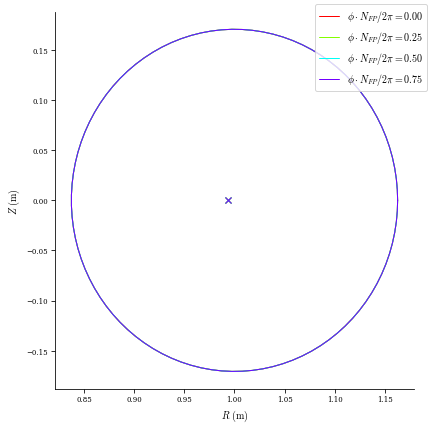

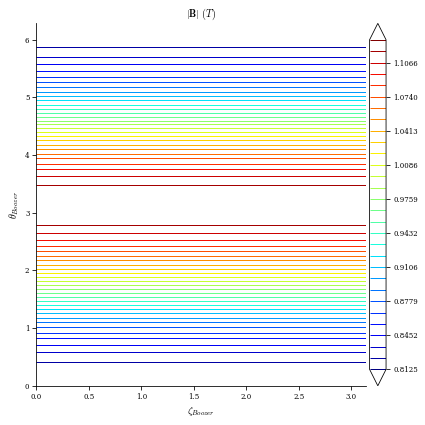

In [6]:


plot_boundary(eq_qs, figsize=(6,6))
plot_boozer_surface(eq_qs, figsize=(6,6))
plot_3d(eq_qs, "|B|", figsize=(6,6))

In [7]:
eq_qs = eq_init.copy()
objective_f = ObjectiveFunction((
#     AspectRatio(eq=eq_qs, target=5, weight=1e-1),
    #FixPressure(eq=eq_qs, weight=constWeight),
    #FixCurrent(eq=eq_qs, weight=constWeight),
    #FixPsi(eq=eq_qs, weight=constWeight),
    ForceBalance(eq=eq_qs, weight=10),
))
optimizer = Optimizer("Turbo1")

for maxMode in range(1,2):
    fixed_R_modes = np.vstack(([0,0,0], eq_qs.surface.R_basis.modes[np.max(np.abs(eq_qs.surface.R_basis.modes), 1) > maxMode, :]))
    free_R_modes = eq_qs.surface.R_basis.modes[np.max(np.abs(eq_qs.surface.R_basis.modes), 1) <= maxMode, :]
    free_R_modes = free_R_modes[np.max(np.abs(free_R_modes), 1) > 0, :]
    
    fixed_Z_modes = eq_qs.surface.Z_basis.modes[np.max(np.abs(eq_qs.surface.Z_basis.modes), 1) > maxMode, :]
    free_Z_modes = eq_qs.surface.Z_basis.modes[np.max(np.abs(eq_qs.surface.Z_basis.modes), 1) <= maxMode, :]
    constWeight = 10
    numRbounds = len(free_R_modes)
    numZbounds = len(free_Z_modes)
    rub = np.ones(numRbounds)
    zub = np.ones(numZbounds)
    Rbounds = (-rub, rub)
    Zbounds = (-zub, zub)
    
    constraints = (
        FixBoundaryR(eq=eq_qs, modes=fixed_R_modes),
        FixBoundaryZ(eq=eq_qs, modes=fixed_Z_modes),
        FixPressure(eq=eq_qs),  # fix pressure profile
        FixPsi(eq=eq_qs),
        FixCurrent(eq=eq_qs),
    )    
    global_eq_qs, result = eq_qs.optimize(
        objective=objective_f,
        constraints=constraints,
        optimizer=optimizer,
        copy=True,
        x_scale = np.ones(363),
        verbose=2,
        maxiter=10000,
        options={"trust_regions":1, "box_size":1e-4, "training_steps": 100, "batch_size":200}
    )

Building objective: force
Precomputing transforms
Timer: Precomputing transforms = 53.6 ms
Timer: Objective build = 177 ms
Building objective: lcfs R
Building objective: lcfs Z
Building objective: fixed pressure
Building objective: fixed Psi
Building objective: fixed current
Building objective: self_consistency R
Building objective: self_consistency Z
Building objective: lambda gauge
Building objective: axis R self consistency
Building objective: axis Z self consistency
Timer: Objective build = 684 ms
Timer: Linear constraint projection build = 976 ms
x0 [ 9.92576484e-07  2.10877062e-07 -2.01398947e-09 -7.27421892e-08
 -6.03569165e-07  1.49115365e-07 -7.13417408e-10 -6.04997045e-07
 -7.28649972e-08 -8.99265133e-10  4.17626198e-02  9.39524756e-09
  4.17636782e-02 -1.02297969e-01 -1.20406205e-08  4.17626181e-02
 -1.02297971e-01  1.45992240e-07 -1.16976130e-08 -2.91725489e-07
  5.11489845e-02  9.05229868e-09  1.47633551e-07  5.11489871e-02
  3.86341355e-10 -1.22349760e-07  8.04983864e-10 

  1.22296564e-07 -2.81532964e-01  1.22270319e-07]
Using dtype = torch.float64 
Using device = cpu
Initial trust region: length_init=0.8, length_min=0.0078125, length_max=1.6
Starting from fbest = 4.25e-05, log(fbest) = -10.07
Initial loss:  1.4277689298181235
Final loss:  0.7905955643664546
ℓ min, max: 0.26619567601602506 4.979914445475662
σ²: tensor(0.4242, dtype=torch.float64)
η²: tensor([2.1581e-05], dtype=torch.float64)


/Users/akaptanoglu/anaconda3/envs/desc_scratch/lib/python3.11/site-packages/gpytorch/models/exact_gp.py:296: GPInputWarning:

The input matches the stored training data. Did you forget to call model.train()?



[GP CHECK] Train MSE: 1.126e-09
2.9186973300458324e-05 4.250068031658487e-05 4.250068031658487e-05
510) New best: 2.919e-05, log(fbest) = -10.44
Initial loss:  1.1079981560051693
Final loss:  -0.3394370922937642
ℓ min, max: 0.24711918675065767 4.9681230901478735
σ²: tensor(0.1361, dtype=torch.float64)
η²: tensor([1.0289e-05], dtype=torch.float64)
[GP CHECK] Train MSE: 7.149e-09
2.081676666173933e-05 2.9186973300458324e-05 2.9186973300458324e-05
710) New best: 2.082e-05, log(fbest) = -10.78
Initial loss:  0.920582774224569
Final loss:  -1.3804251268769498
ℓ min, max: 0.24612848481447006 4.976500306440747
σ²: tensor(0.1026, dtype=torch.float64)
η²: tensor([1.0271e-05], dtype=torch.float64)
[GP CHECK] Train MSE: 6.885e-09
1.5201250893464855e-05 2.081676666173933e-05 2.081676666173933e-05
[TR EXPAND] Trust region expanded: 0.8 -> 1.6
910) New best: 1.52e-05, log(fbest) = -11.09
Initial loss:  0.6360372307714214
Final loss:  -1.8681175884258814
ℓ min, max: 0.2353219097809955 4.9741511464255

ℓ min, max: 0.20682868458257705 4.974226286595012
σ²: tensor(0.1011, dtype=torch.float64)
η²: tensor([1.0271e-05], dtype=torch.float64)
[GP CHECK] Train MSE: 0.0005048
4.694599504128347e-06 6.636101150117944e-06 6.636101150117944e-06
[TR EXPAND] Trust region expanded: 1.6 -> 1.6
5420) New best: 4.695e-06, log(fbest) = -12.27
Initial loss:  -0.19669102985181344
Final loss:  -2.0157767843020693
ℓ min, max: 0.21228122786697307 4.968555338737517
σ²: tensor(0.0723, dtype=torch.float64)
η²: tensor([1.0359e-05], dtype=torch.float64)
[GP CHECK] Train MSE: 0.0005023
3.99829220195285e-06 4.694599504128347e-06 4.694599504128347e-06
5620) New best: 3.998e-06, log(fbest) = -12.43
Initial loss:  -0.29539289077555136
Final loss:  -1.98737313831686
ℓ min, max: 0.17796550985661394 4.957363281009002
σ²: tensor(0.1024, dtype=torch.float64)
η²: tensor([1.0311e-05], dtype=torch.float64)
[GP CHECK] Train MSE: 0.0003537
2.7681841528949904e-06 3.99829220195285e-06 3.99829220195285e-06
5820) New best: 2.768e-0


KeyboardInterrupt



In [ ]:
print(objective_f.compute_scalar(result.allx[np.argmin(result.allfun)]))
print(np.shape(result.x), np.shape(result.allx[-1]), np.shape(result.allx))
print(result.allx[0][np.abs(result.allx[0]) > 1e-6])
print(result.allx[-1][np.abs(result.allx[-1]) > 1e-6])

In [ ]:
plot_boundary(global_eq_qs, figsize=(6,6))
plot_boozer_surface(global_eq_qs, figsize=(6,6))
plot_3d(global_eq_qs, "|B|", figsize=(6,6))

In [ ]:
objective_f.print_value(result.allx[np.argmin(result.allfun)])

In [ ]:
global_eq_qs.x = result.allx[0]
plot_boundary(global_eq_qs, figsize=(6,6))
plot_boozer_surface(global_eq_qs, figsize=(6,6))
plot_3d(global_eq_qs, "|B|", figsize=(6,6))